In [396]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs

In [397]:
X, y = make_blobs(n_samples=100, n_features=2, centers=2,random_state=0 )

In [398]:
y = y.reshape((y.shape[0], 1)) 

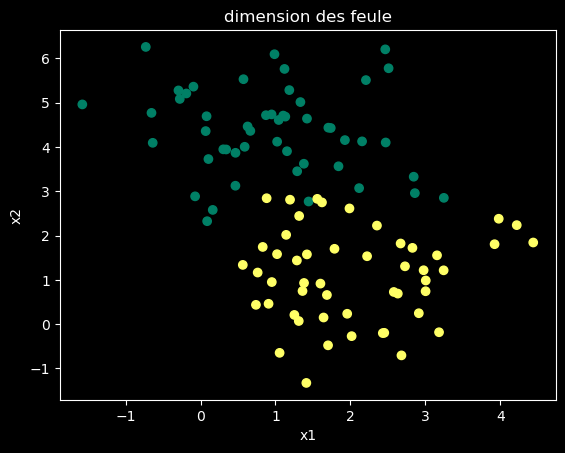

In [399]:

plt.scatter(X[:, 0], X[:, 1], c=y, cmap='summer')  
# Flatten y for coloring
plt.title("dimension des feule")
plt.xlabel("x1")
plt.ylabel("x2")
#plt.colorbar(label='Cluster Label')  # Optional: Add color bar
plt.show()

In [400]:
def initialisation(X):
    # Z = X . W + b
    # X[m,_2_] , W[_2_,1] ==> _2_ == _2_     
    W = np.random.rand(X.shape[1], 1)
    b= np.random.randn(1)
    return (W,b)
            

In [458]:
W, b = initialisation(X)
W.shape

(2, 1)

In [459]:
b.shape

(1,)

In [403]:
def modele(X,W,b):
    Z = X.dot(W) + b
    A = 1/(1 + np.exp(-Z))
    return A

In [404]:
A = modele(X,W,b)
A.shape

(100, 1)

In [405]:
def log_loss(A,y):
    return 1/len(y) * np.sum(-y * np.log(A) - (1-y) * np.log(1-A))

In [406]:
log_loss(A,y)

2.657148338845089

In [407]:
def gradients(A,X,y):
    dW = 1/len(y) * np.dot(X.T, A-y)
    db = 1/len(y) * np.sum(A-y)
    return dW,db

In [408]:
dW,db = gradients(A,X,y) 
dW.shape

(2, 1)

In [409]:
db

0.43392316021292887

In [410]:
def update(dW, db, W, b, learning_rate):
    W = W - learning_rate * dW
    b = b - learning_rate * db
    return (W, b)

In [411]:
W.shape

(2, 1)

In [412]:
b.shape

(1,)

In [413]:
def predict(X, W, b):
    A = modele(X, W, b)
    #print(A)
    return A >= 0.5

In [414]:
from sklearn.metrics import accuracy_score

In [415]:
def artificial_neuron(X, y, learning_rate=0.1, n_iter=100):
    W,b = initialisation(X)
    loss = []
    histoy = []
    for i in range(n_iter):
        A = modele(X, W, b)
        loss.append(log_loss(A, y))
        dW,db =gradients(A,X,y)
        W,b = update(dW, db, W, b, learning_rate)
        histoy.append([W, b,loss,i])
    y_pred = predict(X, W, b)
    print(accuracy_score(y, y_pred))
    plt.plot(loss)
    plt.show()
    
    # les parameters traine pour les stocker allieur
    return histoy

0.91


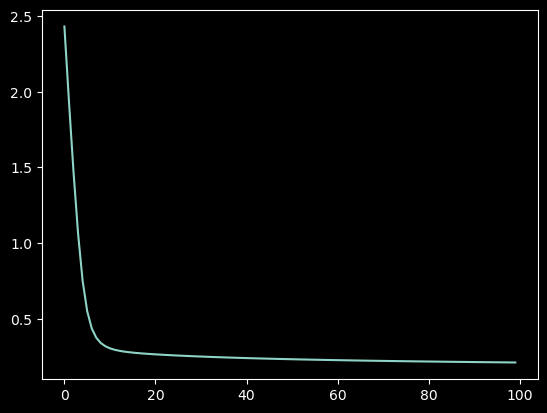

In [416]:
history = artificial_neuron(X, y)

In [417]:
#history

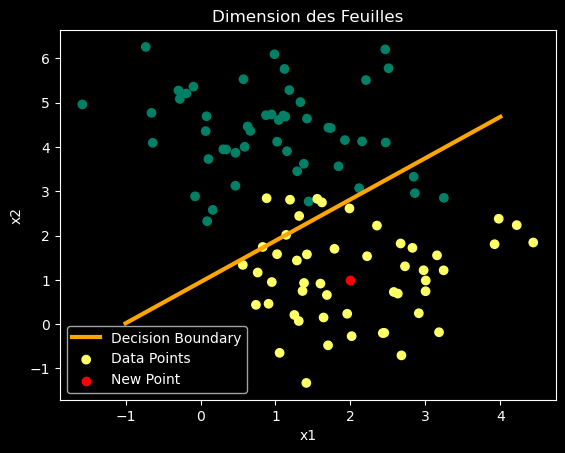

Prediction for the new point: [[ True]]


In [418]:
# Use the final weights and bias from training history
final_W, final_b = history[-1][0], history[-1][1]

# Corrected decision boundary calculation
x0 = np.linspace(-1, 4, 100)
x1 = (-final_W[0] * x0 - final_b) / final_W[1]
# Corrected reshape for new_plante
new_plante = np.array([2, 1]).reshape(1, -1)

# Plot decision boundary and data points
plt.plot(x0, x1, c='orange', lw=3, label='Decision Boundary')  # Plot decision boundary
plt.scatter(X[:, 0], X[:, 1], c=y, cmap='summer', label="Data Points")  # Data points
plt.scatter(new_plante[0, 0], new_plante[0, 1], c='red', label="New plant")  # New point
plt.title("Dimension des Feuilles")
plt.xlabel("x1")
plt.ylabel("x2")
plt.legend()
plt.show()
# Predict class for the new point
prediction = predict(new_plante.reshape(1, -1), final_W, final_b)
print("Prediction for the new point:", prediction)


In [419]:
import  plotly.graph_objects as go
W, b = history[-1][0], history[-1][1]

In [420]:
fig = go.Figure( data= [ go.Scatter3d(
    x = X[:,0].flatten(),
    y = X[:,1].flatten(),
    z = y.flatten(),
    mode='markers',
    marker= dict(size=5, color=y.flatten(), colorscale='YlGn',
                 opacity=0.8, reversescale= True)
)])
fig.update_layout(template='plotly_dark',margin=dict(l=0,r=0,b=0,t=0))
fig.layout.scene.camera.projection.type="orthographic"
fig.show()

In [421]:
x0 = np.linspace(X[:,0].min(),X[:,0].max(),100)
x1 = np.linspace(X[:,1].min(),X[:,1].max(),100)

xx0, xx1 = np.meshgrid(x0,x1)

z = W[0] * xx0 + W[1] * xx1 + b
A = 1/(1 + np.exp(-z))


fig = go.Figure( data= [ go.Surface(
    z = A,
    x = xx0,
    y = xx1,
    colorscale='YlGn',
    opacity=0.8, reversescale= True
)])

fig.add_scatter3d(
    x = X[:,0].flatten(),
    y = X[:,1].flatten(),
    z = y.flatten(),
    mode='markers',
    marker= dict(size=5, color=y.flatten(), colorscale='YlGn',
                 opacity=0.8, reversescale= True)
)
fig.update_layout(template='plotly_dark',margin=dict(l=0,r=0,b=0,t=0))
fig.layout.scene.camera.projection.type="orthographic"
fig.show()

In [448]:
def animate(params):
    W, b, loss, i = params

    ax[0].clear()  # Decision boundary
    ax[1].clear()  # Sigmoid
    ax[2].clear()  # Loss function

    s = 300
    # Scatter plot for the decision boundary
    ax[0].scatter(X[:, 0], X[:, 1], c=y.flatten(), s=s, cmap='summer', edgecolor='k', linewidths=3)
    
    # Decision boundary
    x1 = np.linspace(-3, 6, 100)
    x2 = (- W[0] * x1 - b) / W[1]
    ax[0].plot(x1, x2, c='orange', lw=4)
    ax[0].set_xlim(X[:, 0].min(), X[:, 0].max())
    ax[0].set_ylim(X[:, 1].min(), X[:, 1].max())
    ax[0].set_title('Frontière de Décision')
    ax[0].set_xlabel("x1")
    ax[0].set_ylabel("x2")

    # Sigmoid function
    z = X.dot(W) + b
    z_new = np.linspace(z.min(), z.max(), 100)
    A = 1 / (1 + np.exp(-z_new))
    ax[1].plot(z_new, A, c='orange', lw=4)
    ax[1].scatter(z[y.flatten() == 0], np.zeros(z[y.flatten() == 0].shape), c='#008066', edgecolors='k', linewidths=3, s=s)
    ax[1].scatter(z[y.flatten() == 1], np.ones(z[y.flatten() == 1].shape), c='#ffff66', edgecolors='k', linewidths=3, s=s)
    ax[1].set_xlim(z.min(), z.max())
    ax[1].set_title('Sigmoid')
    ax[1].set_xlabel("Z")
    ax[1].set_ylabel('A(Z)')

    # Loss function
    ax[2].plot(range(i+1), loss[:i+1], color='red', lw=4)
    ax[2].set_xlim(0, len(loss))
    ax[2].set_ylim(0, loss[0] * 1.1)
    ax[2].set_title('Fonction Coût')
    ax[2].set_xlabel('Itération')
    ax[2].set_ylabel('Loss')


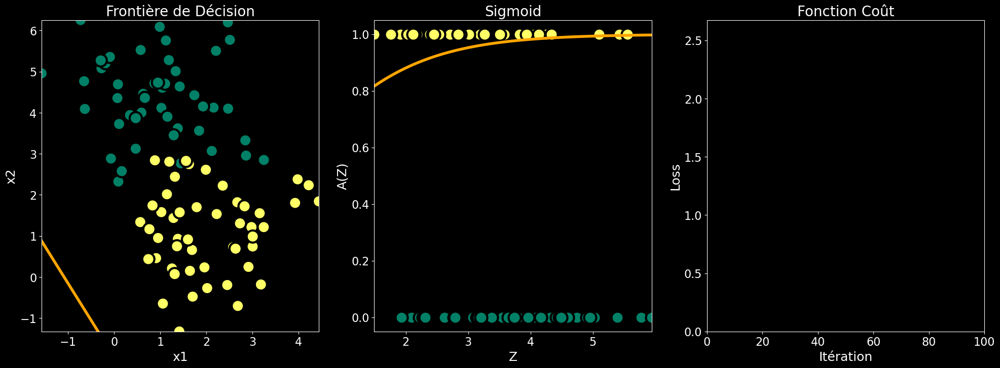

In [449]:
import matplotlib.animation as animation
from IPython.display import HTML,display
import matplotlib.pyplot as plt
import matplotlib as mpl

# Set the Matplotlib style to a dark theme
plt.style.use('dark_background')
# Set the font size globally
mpl.rcParams['font.size'] = 18
mpl.rcParams['axes.titlesize'] = 20
mpl.rcParams['axes.labelsize'] = 18
mpl.rcParams['xtick.labelsize'] = 16
mpl.rcParams['ytick.labelsize'] = 16
mpl.rcParams['legend.fontsize'] = 16

# Increase the embed limit
mpl.rcParams['animation.embed_limit'] = 50  # Set the limit to 50 MB

(fig, ax) = plt.subplots(nrows=1, ncols=3, figsize=(24, 8))

anim = animation.FuncAnimation(fig, animate, frames=history, interval=200, repeat=False)

# Corrected animation writer
#Writer = animation.writers['ffmpeg']
#writer = Writer(fps=4, metadata=dict(artist="me"))

# Save as an MP4
#anim.save('animation.mp4', writer=writer)



In [457]:
# Display the animation inline
display(HTML(anim.to_jshtml()))

In [454]:
# Save the animation as a MP4
anim.save('animation.mp4', writer='pillow')

ValueError: unknown file extension: .mp4

In [460]:
import os
from IPython.display import Video, display

# Check the current working directory
print("Current working directory:", os.getcwd())

# List files in the current directory
print("Files in the current directory:", os.listdir())

# Display the mp4 inline
display(Video(filename='modele_ia/animation.mp4'))

Current working directory: C:\Users\lenovo\Desktop\stady_work\modele_ia
Files in the current directory: ['animation.gif', 'animation.mp4', 'implementation_modele_ia.ipynb']
